# Environment Set Up

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn import linear_model, preprocessing
%matplotlib inline
data = pd.ExcelFile('DataDownload.xls')

Let's start by re-creating the master dataframe.

In [2]:
assistance = data.parse('ASSISTANCE')
assistance_sub = assistance[['State',
                             'County',
                             'REDEMP_SNAPS12',
                             'PCT_SNAP12',
                             'PC_SNAPBEN10',
                             'PC_SNAPBEN15',
                             'SNAP_PART_RATE13',
                             'PCT_FREE_LUNCH14',
                             'PCT_REDUCED_LUNCH14',
                             'PC_WIC_REDEMP12',
                             'REDEMP_WICS12'
                            ]]

In [3]:
access = data.parse('ACCESS')
access_sub = access[['State',
                     'County',
                     'LACCESS_POP10',
                     'PCT_LACCESS_POP10',
                     'LACCESS_LOWI10',
                     'PCT_LACCESS_LOWI10',
                     'LACCESS_HHNV10',
                     'PCT_LACCESS_HHNV10',
                     'LACCESS_SNAP15',
                     'PCT_LACCESS_SNAP15',
                     'LACCESS_CHILD10',
                     'PCT_LACCESS_CHILD10',
                     'LACCESS_SENIORS10',
                     'PCT_LACCESS_SENIORS10'
                     ]]

In [4]:
stores = data.parse('STORES')
stores_sub = stores[['State',
                     'County',
                     'GROC14',
                     'GROCPTH14',
                     'SUPERC14',
                     'SUPERCPTH14',
                     'CONVS14',
                     'CONVSPTH14',
                     'SPECS14',
                     'SPECSPTH14',
                     'SNAPS12',
                     'SNAPSPTH12',
                     'WICS12',
                     'WICSPTH12'
                    ]]

In [5]:
restaurants = data.parse('RESTAURANTS')
restaurants_sub = restaurants[['State',
                               'County',
                               'FFR14',
                               'FFRPTH14',
                               'FSR14',
                               'FSRPTH14',
                               'PC_FFRSALES12',
                               'PC_FSRSALES12'
                              ]]

In [6]:
insecurity = data.parse('INSECURITY')
insecurity_sub = insecurity[['State',
                             'County',
                             'FOODINSEC_10_12',
                             'VLFOODSEC_10_12',
                             'FOODINSEC_CHILD_03_11'
                            ]]

In [7]:
df = data.parse('Supplemental Data - County')
county = df[['State', 'County', '2010 Census Population', 'Population Estimate, 2011', 
              'Population Estimate, 2012', 'Population Estimate, 2013', 
              'Population Estimate, 2014', 'Population Estimate, 2015']].copy()

# Convert strings in pandas series (columns in the dataframe) where values containe a comma into numerical values.

def remove_comma_from_series(var):
    """Parameters
        ---------
        var: pandas Series
        
        For each element of the series, this function will replace every instance of a comma with nothing,
        as represented by the empty quotation marks.  It will then turn the resulting string into an integer.
        Finally, it will return the integer.
    """
    
    new_var = [int(x.replace(",", "")) for x in var ]
    
    return new_var

# The first two columns list the state and country rather than any numeric values,
# so they'd trigger errors in our function.
# I'm sure there's a prettier way of skipping them than plugging the function into a try-except block,
# but it works.

for x in county:
    try:
        county[x] = remove_comma_from_series(county[x])
    except:
        continue

In [8]:
master = county.merge(assistance_sub, on = ['State', 'County'])\
    .merge(access_sub, on = ['State', 'County'])\
    .merge(stores_sub, on = ['State', 'County'])\
    .merge(restaurants_sub, on = ['State', 'County'])\
    .merge(insecurity, on = ['State', 'County'])

# Exploratory Data Analysis

### 1) Establish Baseline

Let's start with the most obvious plot to use as a baseline: PC_SNAPBEN10 vs PC SNAPBEN15.  It is reasonable to assume that there will be a correlation between the percentage of the population of a county that receives SNAP benefits in 2010, and the same metric measured in 2015.

In [10]:
PC_SNAPBEN = master[['PC_SNAPBEN10', 'PC_SNAPBEN15']].dropna()
x=PC_SNAPBEN['PC_SNAPBEN10'].to_numpy()
y=PC_SNAPBEN['PC_SNAPBEN15'].to_numpy()

a, b = np.polyfit(x, y, 1)
print(a, b)

0.9386478301070688 0.197412319332093


<AxesSubplot:xlabel='PC_SNAPBEN10', ylabel='PC_SNAPBEN15'>

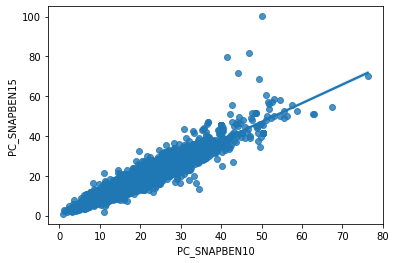

In [11]:
sns.regplot(data = master, x = 'PC_SNAPBEN10', y = 'PC_SNAPBEN15')

In [12]:
ProfileReport(master, 'master profile report', explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2) Feature Comparison

Below, we'll use pairplot to compare multiple features to each other at once to see if there are any apparent correlations.  We'll include '2010 Census Population', 'PC_SNAPBEN10', and the feature we are trying to model 'PC_SNAPBEN15' in each of the plots.
Starting with the Assistance tab, which includes the variable we are trying to model, we can see below that population has no bearing on SNAP benefits, but we do have the expected correlation between benefits in 2010 and 2015 as seen above.  Nothing else seems to have as strong a correlation, but there does seem to be a "fan-like" pattern when plotting PC_SNAPBEN15 against REDEMP_SNAPS12, and a possible vague positive correlation with PCT_SNAP12, so they may warrant a closer look.

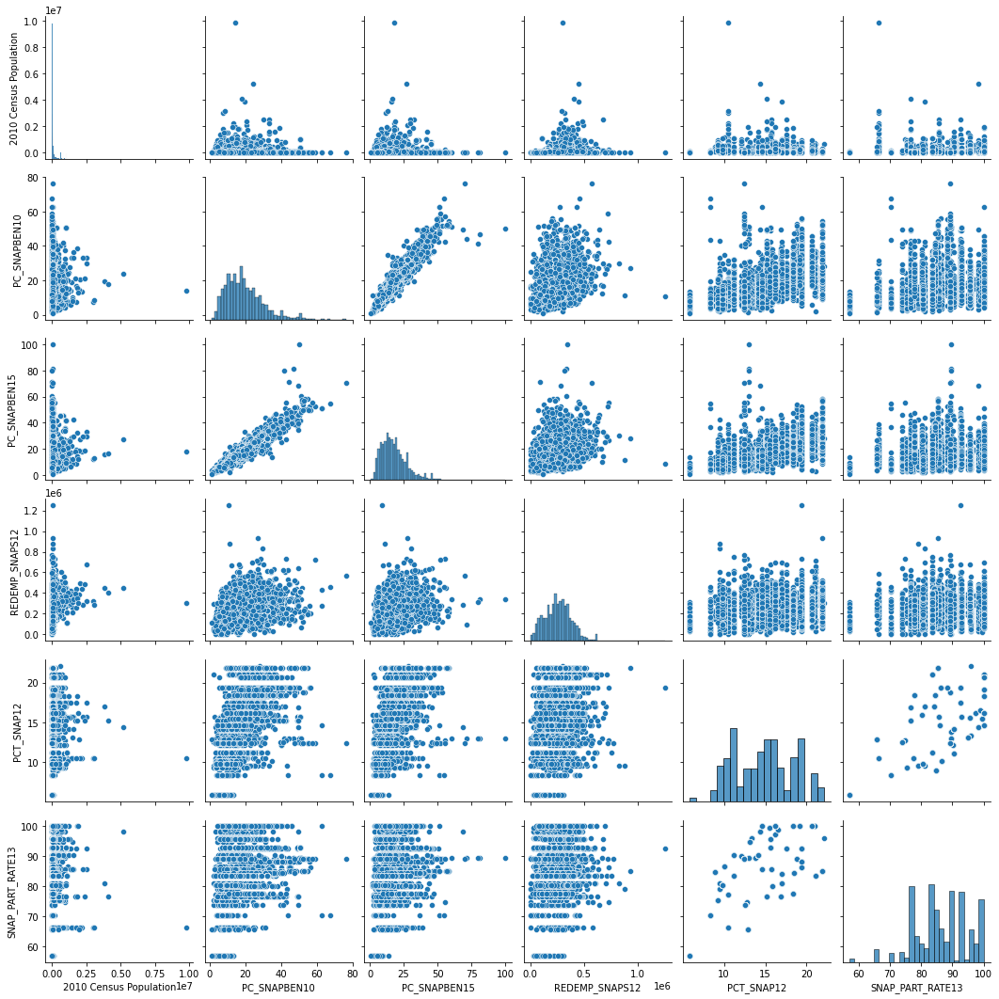

In [13]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                                'REDEMP_SNAPS12', 'PCT_SNAP12', 'SNAP_PART_RATE13'])

Below, we can see that PCT_FREE_LUNCH14 somewhat unexpectedly has a correlation with PC_SNAPBEN15, and PC_WIC_REDEMP12 may also be of use.

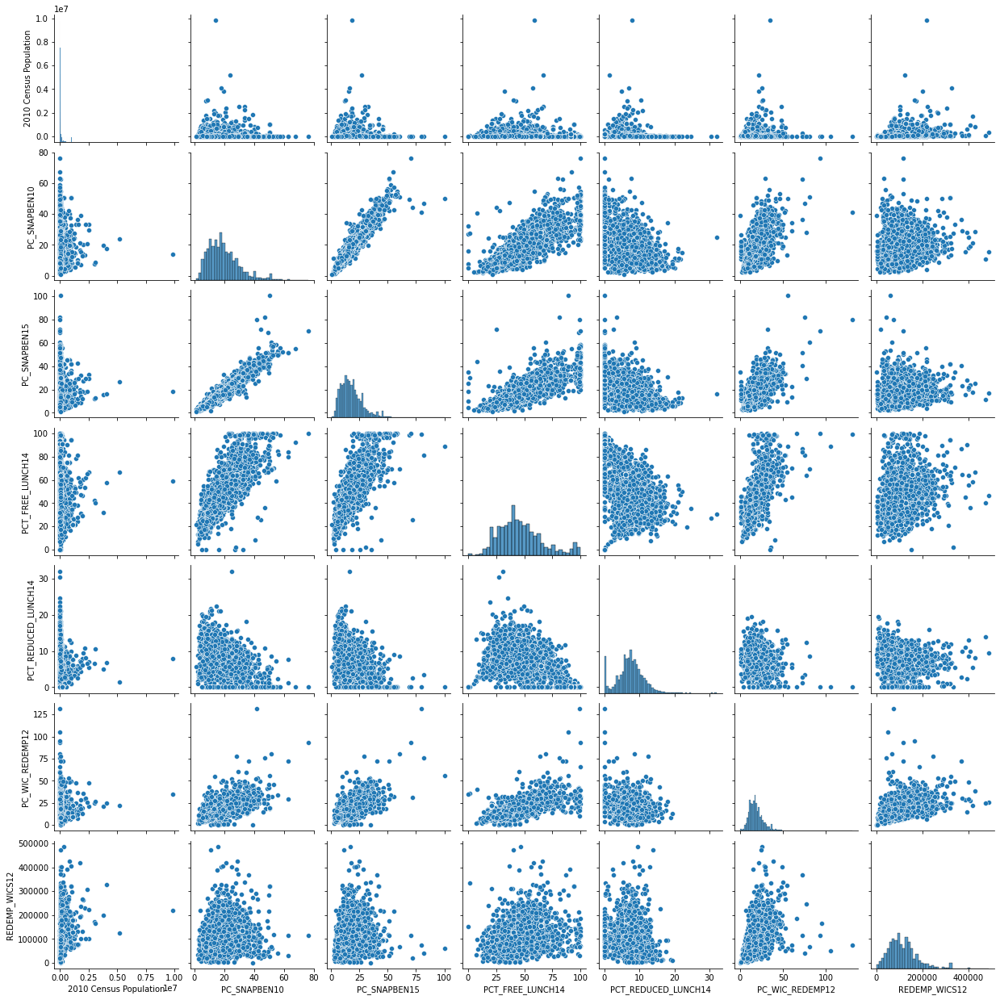

In [14]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                             'PCT_FREE_LUNCH14',
                             'PCT_REDUCED_LUNCH14',
                             'PC_WIC_REDEMP12',
                             'REDEMP_WICS12'])

Moving on to the Access tab, we don't see many promising options, though PCT_LACCESS_HHNV10 may be of use as seen below.

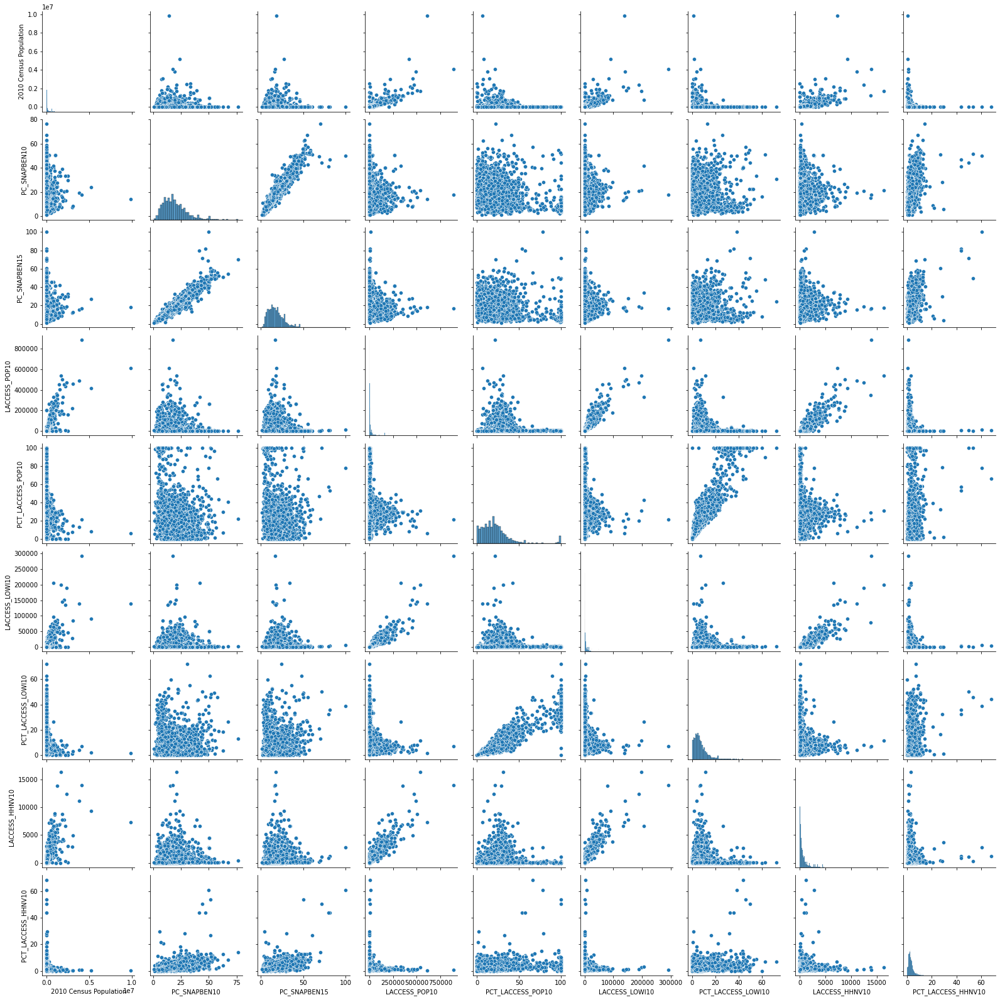

In [15]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'LACCESS_POP10',
                     'PCT_LACCESS_POP10',
                     'LACCESS_LOWI10',
                     'PCT_LACCESS_LOWI10',
                     'LACCESS_HHNV10',
                     'PCT_LACCESS_HHNV10'])

There isn't much else of use in the rest of the tab, though PCT_LACCESS_SNAP15 may be worth a second look.

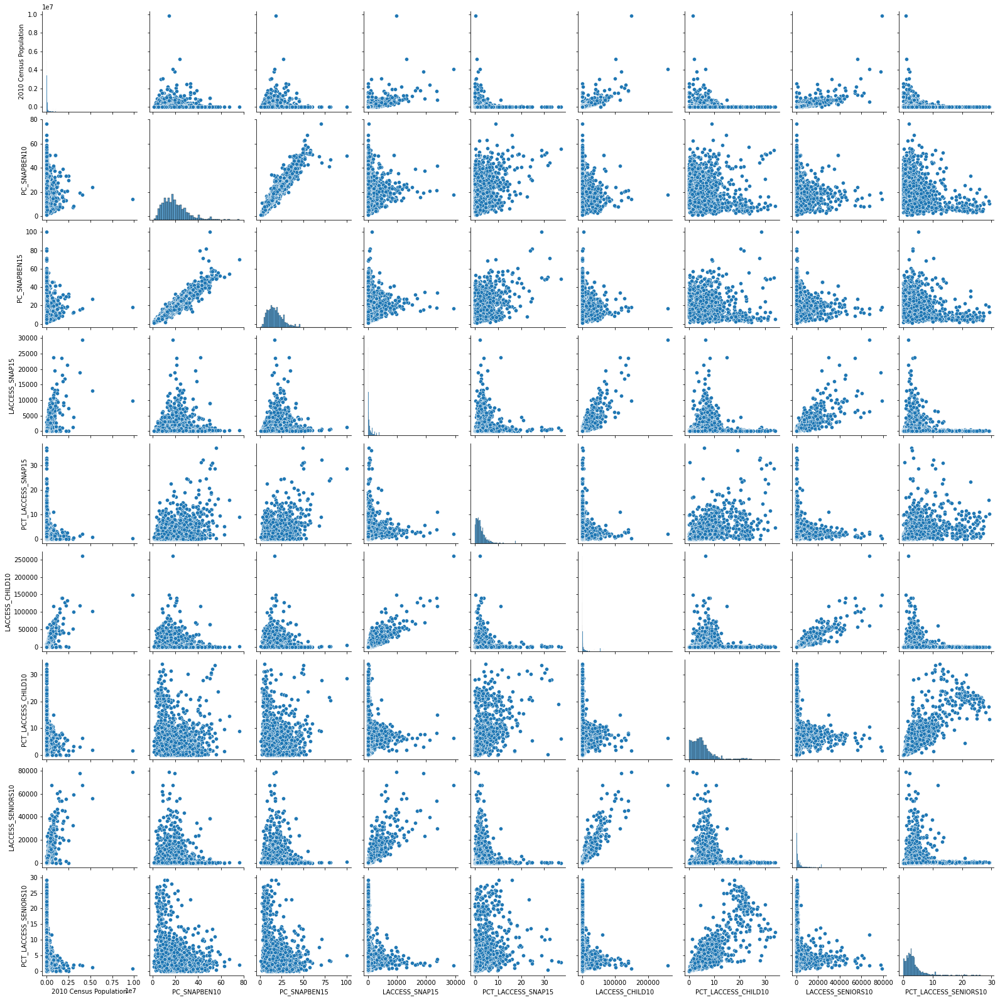

In [16]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'LACCESS_SNAP15',
                     'PCT_LACCESS_SNAP15',
                     'LACCESS_CHILD10',
                     'PCT_LACCESS_CHILD10',
                     'LACCESS_SENIORS10',
                     'PCT_LACCESS_SENIORS10'])

The Stores tab doesn't look promising, as seen below.

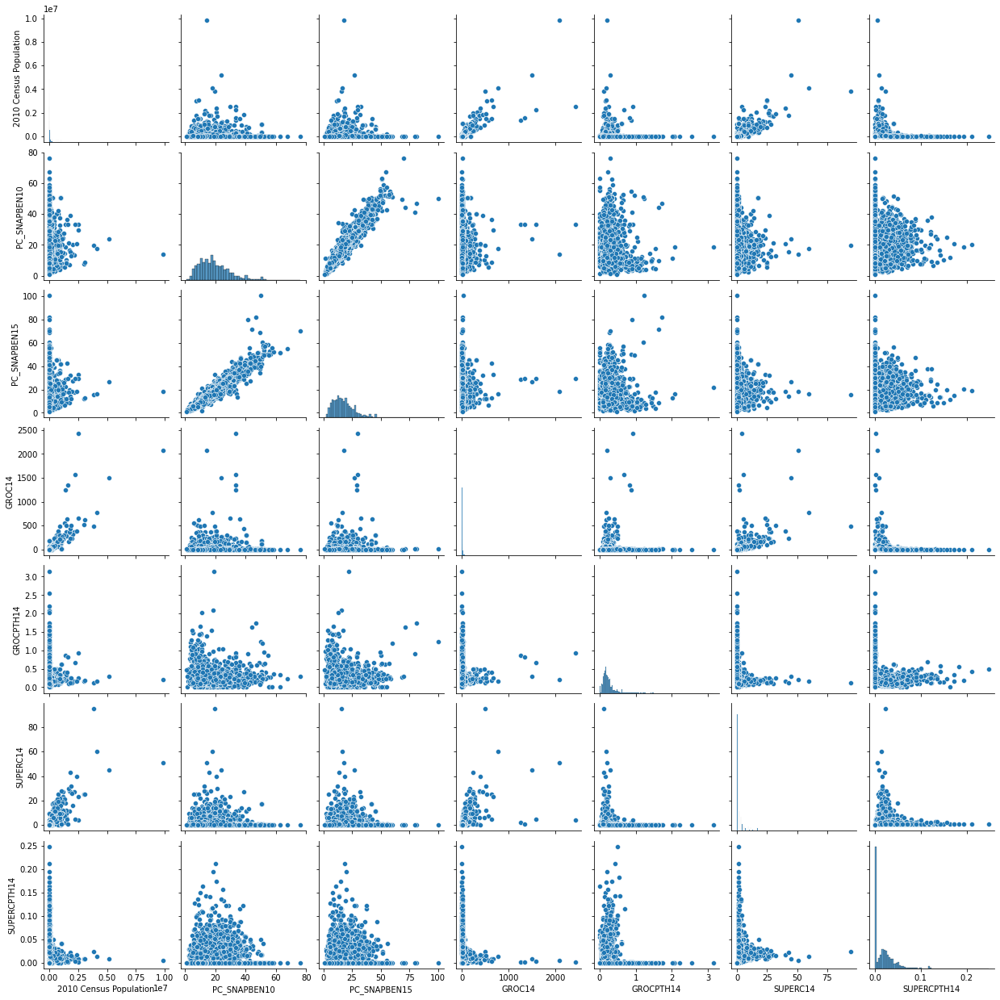

In [17]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'GROC14',
                     'GROCPTH14',
                     'SUPERC14',
                     'SUPERCPTH14'])

Below, we continue to find little of use.

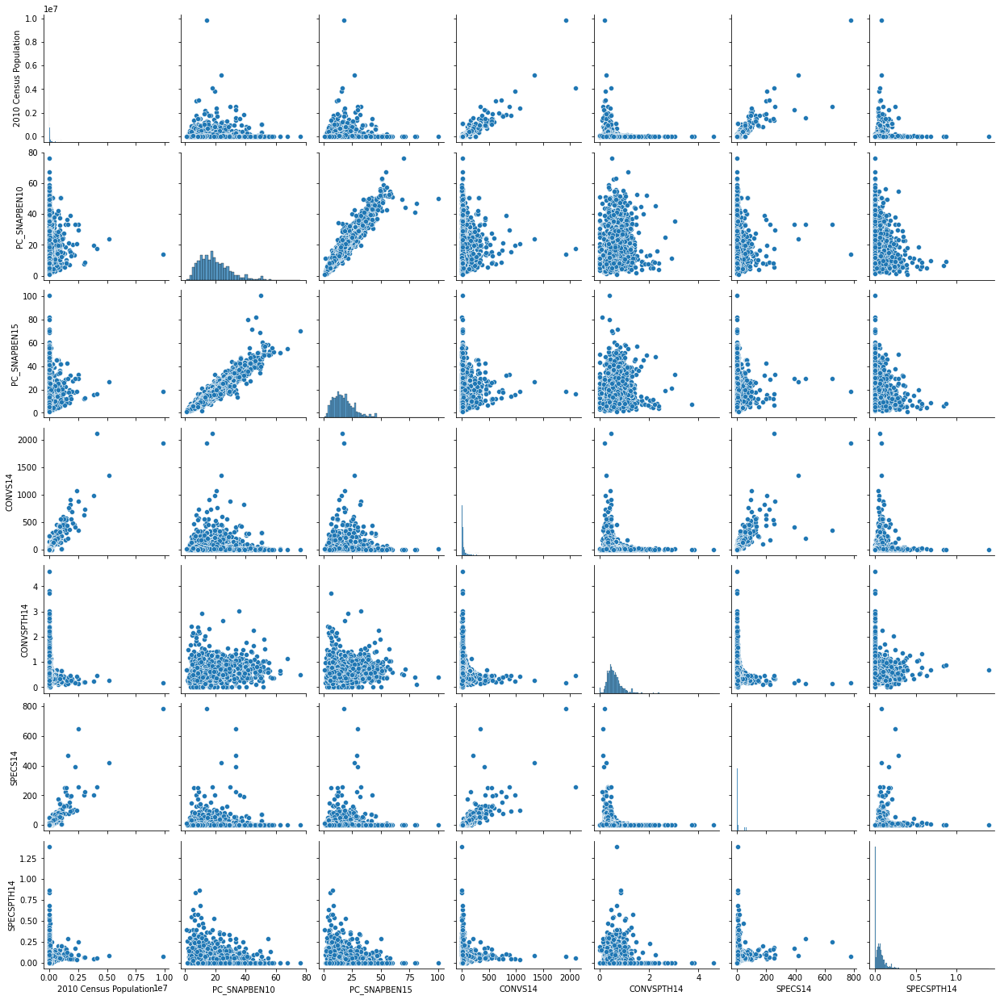

In [18]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'CONVS14',
                     'CONVSPTH14',
                     'SPECS14',
                     'SPECSPTH14'])

While SNAPS12 shows no correlation with PC_SNAPBEN15, SNAPSPTH12 looks potentialy useful.

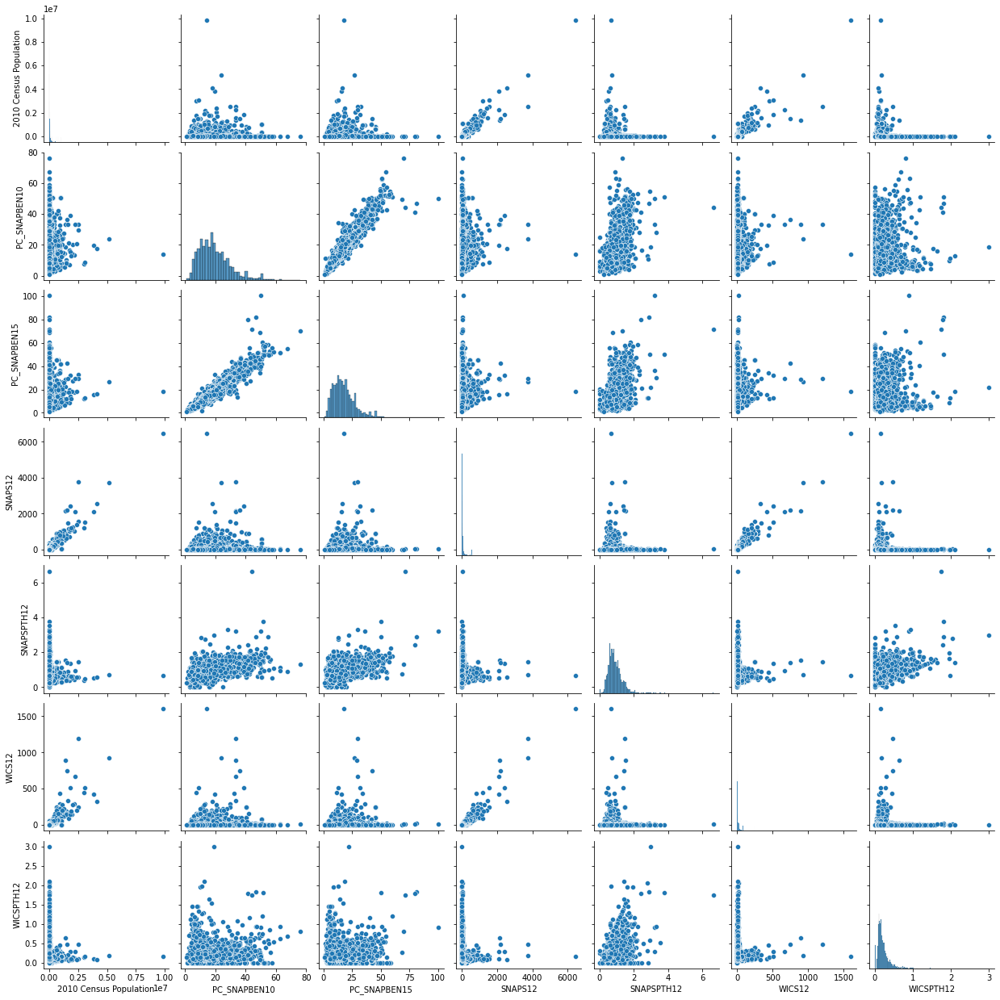

In [19]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'SNAPS12',
                     'SNAPSPTH12',
                     'WICS12',
                     'WICSPTH12'])

The Restaurants tab below has nothing we can use.

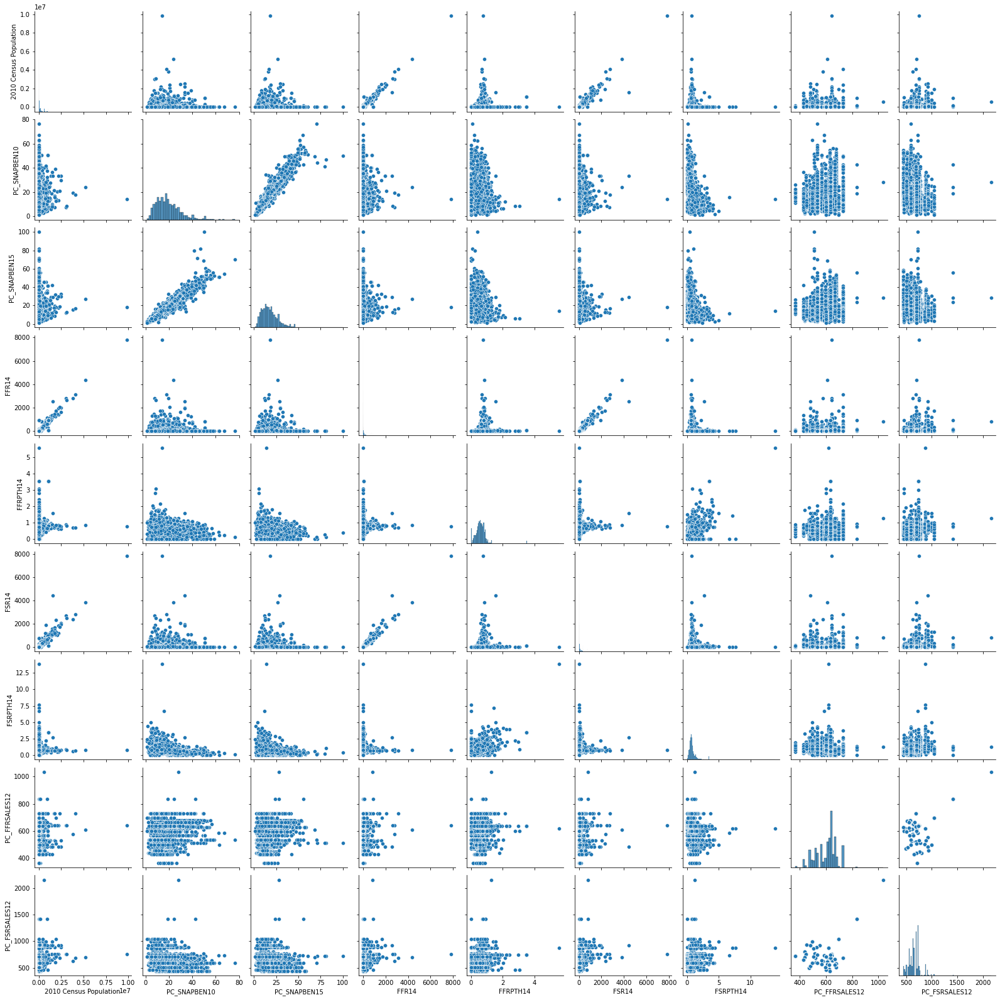

In [20]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                               'FFR14',
                               'FFRPTH14',
                               'FSR14',
                               'FSRPTH14',
                               'PC_FFRSALES12',
                               'PC_FSRSALES12'])

Likewise, the Insecurity tab has no strong correlations either.

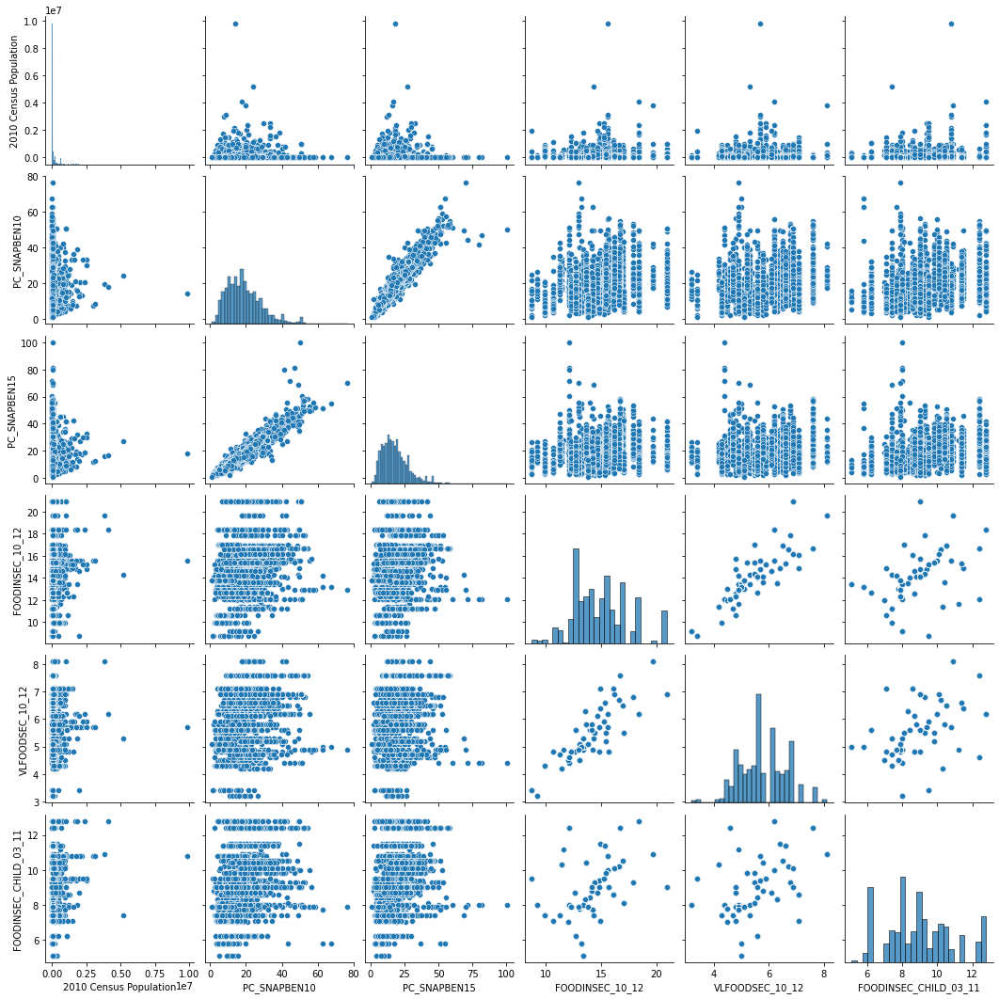

In [21]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                             'FOODINSEC_10_12',
                             'VLFOODSEC_10_12',
                             'FOODINSEC_CHILD_03_11'])

# Put it Together

The features below seem most likely to be of use in modeling PC_SNAPBEN15

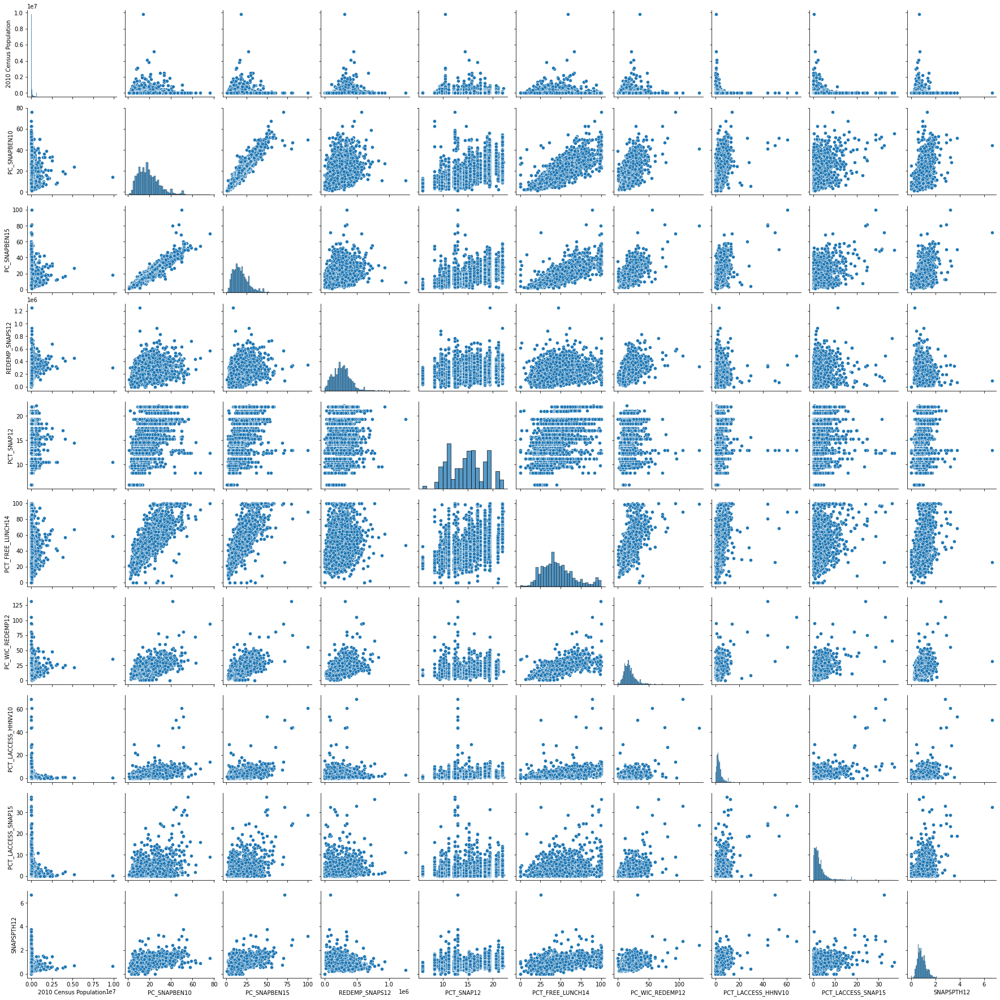

In [22]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                             'REDEMP_SNAPS12',
                             'PCT_SNAP12',
                             'PCT_FREE_LUNCH14',
                             'PC_WIC_REDEMP12',
                             'PCT_LACCESS_HHNV10',
                             'PCT_LACCESS_SNAP15',
                             'SNAPSPTH12'])

Let's isolate the features of interest in their own subset.  This is what we're actually going to work with.

In [23]:
master_subset = master[['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                             'REDEMP_SNAPS12',
                             'PCT_SNAP12',
                             'PCT_FREE_LUNCH14',
                             'PC_WIC_REDEMP12',
                             'PCT_LACCESS_HHNV10',
                             'PCT_LACCESS_SNAP15',
                             'SNAPSPTH12']]